In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as sk
%matplotlib inline
import pandas_profiling
from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split
import statsmodels.formula.api as smf

In [3]:
df = pd.read_excel("H:/data science full/analytics lab/projects/1.credit card spend prediction/Data Set.xlsx")


In [4]:
print(df.isnull().sum())

custid         0
region         0
townsize       2
gender         0
age            0
              ..
ownfax         0
news           0
response_01    0
response_02    0
response_03    0
Length: 130, dtype: int64


In [5]:
print(df.columns)

Index(['custid', 'region', 'townsize', 'gender', 'age', 'agecat', 'birthmonth',
       'ed', 'edcat', 'jobcat',
       ...
       'owncd', 'ownpda', 'ownpc', 'ownipod', 'owngame', 'ownfax', 'news',
       'response_01', 'response_02', 'response_03'],
      dtype='object', length=130)


In [6]:
df.head()

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,owncd,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03
0,3964-QJWTRG-NPN,1,2.0,1,20,2,September,15,3,1,...,0,0,0,1,1,0,0,0,1,0
1,0648-AIPJSP-UVM,5,5.0,0,22,2,May,17,4,2,...,1,1,1,1,1,1,1,0,0,0
2,5195-TLUDJE-HVO,3,4.0,1,67,6,June,14,2,2,...,1,0,0,0,0,0,1,0,0,0
3,4459-VLPQUH-3OL,4,3.0,0,23,2,May,16,3,2,...,1,0,1,1,1,0,1,1,0,0
4,8158-SMTQFB-CNO,2,2.0,0,26,3,July,16,3,2,...,1,0,1,0,1,0,0,0,1,0


In [7]:
df.loc[:, df.dtypes == float].head(2)

,townsize,lninc,debtinc,creddebt,lncreddebt,othdebt,lnothdebt,carvalue,commutetime,cardspent,...,equipten,lnequipten,cardmon,lncardmon,cardten,lncardten,wiremon,lnwiremon,wireten,lnwireten
0,2.0,3.433987,11.1,1.200909,0.183079,2.240091,0.806516,14.3,22.0,81.66,...,126.1,4.837075,14.25,2.656757,60.0,4.094345,0.00,NaN,0.00,NaN
1,5.0,2.708050,18.6,1.222020,0.200505,1.567980,0.449788,6.8,29.0,42.60,...,1975.0,7.588324,16.00,2.772589,610.0,6.413459,45.65,3.821004,1683.55,7.42866


<AxesSubplot:ylabel='Frequency'>

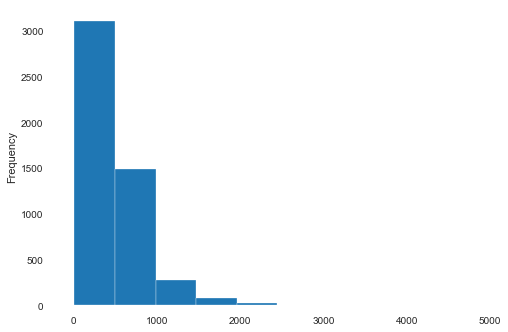

In [8]:
df['total_spent'] = df['cardspent'] + df['card2spent']
df['total_spent'].plot(kind='hist')

<AxesSubplot:ylabel='Frequency'>

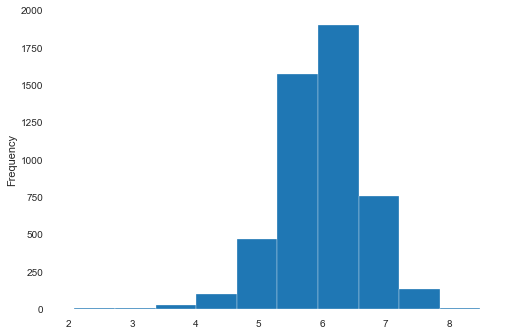

In [9]:
df['log_total_spent'] = np.log(df['total_spent']) #took log of unnormalized variable
df['log_total_spent'].plot(kind='hist')

In [10]:
column_titles=['gender','agecat','lninc','card','card2','log_total_spent','region','jobcat','jobsat','card2benefit','cardbenefit',
              'cardtype','card2type','reason','tenure','default','debtinc','edcat','empcat','retire','inccat','homeown',
              'addresscat','carcatvalue','churn']
df1=df.reindex(columns = column_titles)


In [11]:
df1.head(2)
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   gender           5000 non-null   int64  
 1   agecat           5000 non-null   int64  
 2   lninc            5000 non-null   float64
 3   card             5000 non-null   int64  
 4   card2            5000 non-null   int64  
 5   log_total_spent  5000 non-null   float64
 6   region           5000 non-null   int64  
 7   jobcat           5000 non-null   int64  
 8   jobsat           5000 non-null   int64  
 9   card2benefit     5000 non-null   int64  
 10  cardbenefit      5000 non-null   int64  
 11  cardtype         5000 non-null   int64  
 12  card2type        5000 non-null   int64  
 13  reason           5000 non-null   int64  
 14  tenure           5000 non-null   int64  
 15  default          5000 non-null   int64  
 16  debtinc          5000 non-null   float64
 17  edcat         

In [12]:
report_2= pandas_profiling.ProfileReport(df1)
report_2

In [13]:
df1.dtypes
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   gender           5000 non-null   int64  
 1   agecat           5000 non-null   int64  
 2   lninc            5000 non-null   float64
 3   card             5000 non-null   int64  
 4   card2            5000 non-null   int64  
 5   log_total_spent  5000 non-null   float64
 6   region           5000 non-null   int64  
 7   jobcat           5000 non-null   int64  
 8   jobsat           5000 non-null   int64  
 9   card2benefit     5000 non-null   int64  
 10  cardbenefit      5000 non-null   int64  
 11  cardtype         5000 non-null   int64  
 12  card2type        5000 non-null   int64  
 13  reason           5000 non-null   int64  
 14  tenure           5000 non-null   int64  
 15  default          5000 non-null   int64  
 16  debtinc          5000 non-null   float64
 17  edcat         

In [14]:
# Creating Data audit Report
# Use a general function that returns multiple values
def var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  x.std(), x.var(), x.std()/x.mean(), x.min(), x.dropna().quantile(0.01), x.dropna().quantile(0.05),x.dropna().quantile(0.10),x.dropna().quantile(0.25),x.dropna().quantile(0.50),x.dropna().quantile(0.75), x.dropna().quantile(0.90),x.dropna().quantile(0.95), x.dropna().quantile(0.99),x.max()], 
                  index=['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'CV','MIN', 'P1' , 'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])


In [15]:
conti_vars=df1.select_dtypes(['float64','int64'])
conti_vars = round(conti_vars,2)
num_summary=conti_vars.apply(var_summary).T
num_summary

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,CV,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
gender,5000.0,0.0,2518.00,0.503600,1.00,0.500037,0.250037,0.992925,0.00,0.00,0.00,0.000,0.00,1.00,1.00,1.000,1.00,1.0000,1.00
agecat,5000.0,0.0,21194.00,4.238800,4.00,1.308785,1.712917,0.308763,2.00,2.00,2.00,2.000,3.00,4.00,5.00,6.000,6.00,6.0000,6.00
lninc,5000.0,0.0,18499.20,3.699840,3.64,0.746945,0.557927,0.201886,2.20,2.20,2.56,2.770,3.18,3.64,4.20,4.691,4.99,5.6100,6.98
card,5000.0,0.0,13571.00,2.714200,3.00,1.184905,1.403999,0.436558,1.00,1.00,1.00,1.000,2.00,3.00,4.00,4.000,4.00,5.0000,5.00
card2,5000.0,0.0,13872.00,2.774400,3.00,1.173448,1.376980,0.422956,1.00,1.00,1.00,1.000,2.00,3.00,4.00,4.000,5.00,5.0000,5.00
log_total_spent,5000.0,0.0,30006.24,6.001248,6.03,0.671513,0.450930,0.111896,2.09,4.06,4.89,5.219,5.62,6.03,6.42,6.810,7.04,7.4701,8.49
region,5000.0,0.0,15007.00,3.001400,3.00,1.421760,2.021402,0.473699,1.00,1.00,1.00,1.000,2.00,3.00,4.00,5.000,5.00,5.0000,5.00
jobcat,5000.0,0.0,13764.00,2.752800,2.00,1.737900,3.020296,0.631321,1.00,1.00,1.00,1.000,1.00,2.00,4.00,6.000,6.00,6.0000,6.00
jobsat,5000.0,0.0,14821.00,2.964200,3.00,1.379456,1.902899,0.465372,1.00,1.00,1.00,1.000,2.00,3.00,4.00,5.000,5.00,5.0000,5.00
card2benefit,5000.0,0.0,12670.00,2.534000,3.00,1.117271,1.248294,0.440912,1.00,1.00,1.00,1.000,2.00,3.00,4.00,4.000,4.00,4.0000,4.00


In [16]:
convert_dict = {'agecat': object,'reason':object,'region':object,'cardbenefit':object,'card2benefit':object,'card':object,'card2':object,'cardtype':object,'card2type':object,'inccat':object,'addresscat':object,'carcatvalue':object}
df1 = df1.astype(convert_dict)
df1.dtypes

gender               int64
agecat              object
lninc              float64
card                object
card2               object
log_total_spent    float64
region              object
jobcat               int64
jobsat               int64
card2benefit        object
cardbenefit         object
cardtype            object
card2type           object
reason              object
tenure               int64
default              int64
debtinc            float64
edcat                int64
empcat               int64
retire               int64
inccat              object
homeown              int64
addresscat          object
carcatvalue         object
churn                int64
dtype: object

In [17]:
cat_vars=df1.select_dtypes('object')

In [18]:
def cat_var_summary(x):
    Mode = x.value_counts().sort_values(ascending = False)[0:1].reset_index()
    return pd.Series([x.count(), x.isnull().sum(), Mode.iloc[0, 0], Mode.iloc[0, 1], 
                          round(Mode.iloc[0, 1] * 100/x.count(), 2)], 
                  index = ['N', 'NMISS', 'MODE', 'FREQ', 'PERCENT'])

cat_summary=cat_vars.apply(cat_var_summary)

In [19]:
cat_summary.T

,N,NMISS,MODE,FREQ,PERCENT
agecat,5000.0,0.0,4.0,1222.0,24.44
card,5000.0,0.0,4.0,1344.0,26.88
card2,5000.0,0.0,3.0,1384.0,27.68
region,5000.0,0.0,5.0,1027.0,20.54
card2benefit,5000.0,0.0,4.0,1294.0,25.88
cardbenefit,5000.0,0.0,3.0,1274.0,25.48
cardtype,5000.0,0.0,4.0,1260.0,25.20
card2type,5000.0,0.0,4.0,1319.0,26.38
reason,5000.0,0.0,9.0,4052.0,81.04
inccat,5000.0,0.0,2.0,1797.0,35.94


In [20]:
#An utility function to create dummy variable
def create_dummies(df, colname):
    col_dummies = pd.get_dummies(df[colname], prefix = colname, drop_first = True)
    df = pd.concat([df, col_dummies], axis = 1)
    df.drop(colname, axis = 1, inplace = True )
    return df

In [21]:
# get the useful categorical variables
cat_vars = df1[['agecat','reason','region','card2benefit','cardbenefit','card','card2','cardtype','card2type','inccat','carcatvalue','addresscat']]

# for c_feature in categorical_features
for c_feature in ['agecat','reason','region','card2benefit','cardbenefit','card','card2','cardtype','card2type','inccat','carcatvalue','addresscat']:
    cat_vars[c_feature] = cat_vars[c_feature].astype('category')
    cat_vars = create_dummies(cat_vars, c_feature)

C:\Users\anubh\anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [22]:
cat_vars.apply(cat_var_summary).T

,N,NMISS,MODE,FREQ,PERCENT
agecat_3,5000.0,0.0,0.0,4107.0,82.14
agecat_4,5000.0,0.0,0.0,3778.0,75.56
agecat_5,5000.0,0.0,0.0,3805.0,76.10
agecat_6,5000.0,0.0,0.0,3932.0,78.64
reason_2,5000.0,0.0,0.0,4661.0,93.22
reason_3,5000.0,0.0,0.0,4943.0,98.86
reason_4,5000.0,0.0,0.0,4895.0,97.90
reason_9,5000.0,0.0,1.0,4052.0,81.04
region_2,5000.0,0.0,0.0,4005.0,80.10
region_3,5000.0,0.0,0.0,3997.0,79.94


In [24]:
num_summary

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,CV,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
gender,5000.0,0.0,2518.00,0.503600,1.00,0.500037,0.250037,0.992925,0.00,0.00,0.00,0.000,0.00,1.00,1.00,1.000,1.00,1.0000,1.00
agecat,5000.0,0.0,21194.00,4.238800,4.00,1.308785,1.712917,0.308763,2.00,2.00,2.00,2.000,3.00,4.00,5.00,6.000,6.00,6.0000,6.00
lninc,5000.0,0.0,18499.20,3.699840,3.64,0.746945,0.557927,0.201886,2.20,2.20,2.56,2.770,3.18,3.64,4.20,4.691,4.99,5.6100,6.98
card,5000.0,0.0,13571.00,2.714200,3.00,1.184905,1.403999,0.436558,1.00,1.00,1.00,1.000,2.00,3.00,4.00,4.000,4.00,5.0000,5.00
card2,5000.0,0.0,13872.00,2.774400,3.00,1.173448,1.376980,0.422956,1.00,1.00,1.00,1.000,2.00,3.00,4.00,4.000,5.00,5.0000,5.00
log_total_spent,5000.0,0.0,30006.24,6.001248,6.03,0.671513,0.450930,0.111896,2.09,4.06,4.89,5.219,5.62,6.03,6.42,6.810,7.04,7.4701,8.49
region,5000.0,0.0,15007.00,3.001400,3.00,1.421760,2.021402,0.473699,1.00,1.00,1.00,1.000,2.00,3.00,4.00,5.000,5.00,5.0000,5.00
jobcat,5000.0,0.0,13764.00,2.752800,2.00,1.737900,3.020296,0.631321,1.00,1.00,1.00,1.000,1.00,2.00,4.00,6.000,6.00,6.0000,6.00
jobsat,5000.0,0.0,14821.00,2.964200,3.00,1.379456,1.902899,0.465372,1.00,1.00,1.00,1.000,2.00,3.00,4.00,5.000,5.00,5.0000,5.00
card2benefit,5000.0,0.0,12670.00,2.534000,3.00,1.117271,1.248294,0.440912,1.00,1.00,1.00,1.000,2.00,3.00,4.00,4.000,4.00,4.0000,4.00


In [25]:
df1_new = pd.concat([conti_vars,cat_vars], axis=1)
df1_new

,gender,agecat,lninc,card,card2,log_total_spent,region,jobcat,jobsat,card2benefit,...,inccat_3,inccat_4,inccat_5,carcatvalue_1,carcatvalue_2,carcatvalue_3,addresscat_2,addresscat_3,addresscat_4,addresscat_5
0,1,2,3.43,3,5,5.01,1,1,1,1,...,0,0,0,1,0,0,0,0,0,0
1,0,2,2.71,2,4,4.35,5,2,1,3,...,0,0,0,1,0,0,0,0,0,0
2,1,6,3.56,2,4,5.89,3,2,4,3,...,0,0,0,1,0,0,0,0,0,1
3,0,2,3.00,2,3,5.88,4,2,2,4,...,0,0,0,1,0,0,1,0,0,0
4,0,3,3.14,4,1,6.23,2,2,1,2,...,0,0,0,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0,6,5.28,1,3,7.26,2,1,1,4,...,0,0,1,0,0,1,0,0,1,0
4996,0,5,4.42,3,5,5.90,3,1,5,2,...,0,1,0,0,0,1,0,1,0,0
4997,0,6,4.68,1,2,7.33,4,1,3,4,...,0,1,0,0,0,1,0,0,0,1
4998,0,4,5.24,3,4,6.62,1,2,4,1,...,0,0,1,0,0,1,0,0,1,0


In [26]:
df1_new.isnull().sum()

gender           0
agecat           0
lninc            0
card             0
card2            0
                ..
carcatvalue_3    0
addresscat_2     0
addresscat_3     0
addresscat_4     0
addresscat_5     0
Length: 68, dtype: int64

<AxesSubplot:xlabel='log_total_spent'>

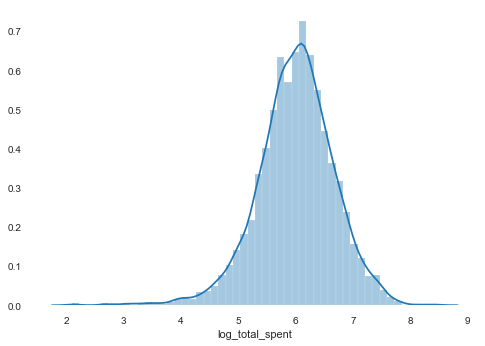

In [27]:
sns.distplot(df1_new.log_total_spent)

In [28]:
corrm=df1_new.corr()
corrm

,gender,agecat,lninc,card,card2,log_total_spent,region,jobcat,jobsat,card2benefit,...,inccat_3,inccat_4,inccat_5,carcatvalue_1,carcatvalue_2,carcatvalue_3,addresscat_2,addresscat_3,addresscat_4,addresscat_5
gender,1.000000,-0.007427,0.002010,0.048498,0.030362,-0.078247,-0.012810,-0.016470,0.001782,0.006584,...,-0.001627,0.003164,-0.014095,0.013502,-0.001896,-0.009122,0.003537,-0.000834,0.008011,-0.011064
agecat,-0.007427,1.000000,0.190910,0.009448,-0.010372,0.025955,-0.018455,0.032554,0.422564,-0.016361,...,0.086558,0.132141,0.162601,-0.194827,0.056373,0.197364,-0.356472,-0.047162,0.247786,0.568118
lninc,0.002010,0.190910,1.000000,0.021011,-0.079283,0.402987,0.043034,0.054794,0.262568,-0.006230,...,0.240772,0.430149,0.580214,-0.705698,0.247815,0.663121,-0.129891,0.063694,0.190643,0.084924
card,0.048498,0.009448,0.021011,1.000000,-0.379440,-0.232039,0.002612,-0.020424,0.010016,-0.016155,...,0.006679,-0.007645,0.022028,-0.000799,0.019059,0.004619,0.011341,-0.003551,-0.020717,0.025085
card2,0.030362,-0.010372,-0.079283,-0.379440,1.000000,-0.075987,0.003786,0.020124,-0.025752,-0.007270,...,-0.017663,-0.009813,-0.054649,0.050569,-0.022794,-0.031126,-0.011248,-0.007357,-0.001236,-0.011309
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
carcatvalue_3,-0.009122,0.197364,0.663121,0.004619,-0.031126,0.257831,0.031213,0.114653,0.224476,-0.018202,...,-0.093826,0.479781,0.578860,-0.430630,-0.261227,1.000000,-0.144137,-0.024186,0.147313,0.131244
addresscat_2,0.003537,-0.356472,-0.129891,0.011341,-0.011248,-0.036061,-0.001194,-0.029467,-0.166053,0.018306,...,-0.052854,-0.099460,-0.110891,0.138286,-0.030545,-0.144137,1.000000,-0.261432,-0.249805,-0.252360
addresscat_3,-0.000834,-0.047162,0.063694,-0.003551,-0.007357,0.036543,0.011884,-0.038623,0.022854,-0.015008,...,0.081121,0.008679,-0.066040,-0.060416,0.089476,-0.024186,-0.261432,1.000000,-0.308732,-0.311890
addresscat_4,0.008011,0.247786,0.190643,-0.020717,-0.001236,0.053562,-0.003889,0.017168,0.151348,-0.029549,...,0.070026,0.123261,0.097646,-0.166552,0.061808,0.147313,-0.249805,-0.308732,1.000000,-0.298019


<AxesSubplot:>

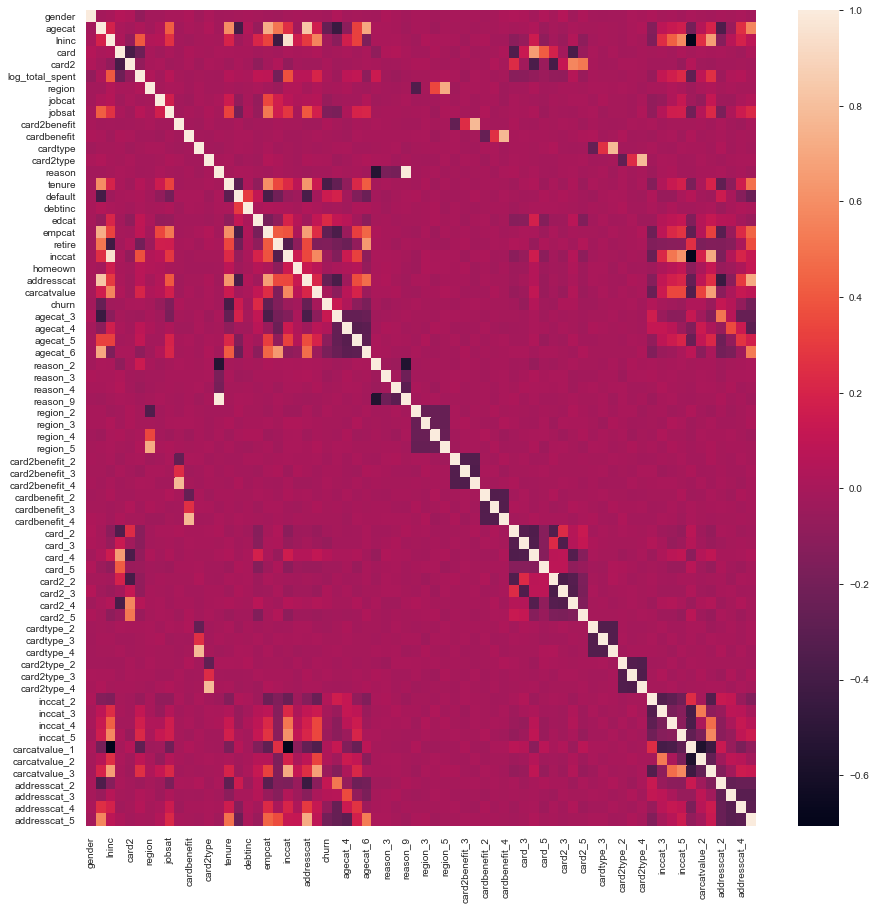

In [29]:
plt.figure(figsize = (15, 15))
sns.heatmap(df1_new.corr())

In [30]:
feature_columns = df1_new.columns.difference( ['log_total_spent'] )
feature_columns

Index(['addresscat', 'addresscat_2', 'addresscat_3', 'addresscat_4',
       'addresscat_5', 'agecat', 'agecat_3', 'agecat_4', 'agecat_5',
       'agecat_6', 'carcatvalue', 'carcatvalue_1', 'carcatvalue_2',
       'carcatvalue_3', 'card', 'card2', 'card2_2', 'card2_3', 'card2_4',
       'card2_5', 'card2benefit', 'card2benefit_2', 'card2benefit_3',
       'card2benefit_4', 'card2type', 'card2type_2', 'card2type_3',
       'card2type_4', 'card_2', 'card_3', 'card_4', 'card_5', 'cardbenefit',
       'cardbenefit_2', 'cardbenefit_3', 'cardbenefit_4', 'cardtype',
       'cardtype_2', 'cardtype_3', 'cardtype_4', 'churn', 'debtinc', 'default',
       'edcat', 'empcat', 'gender', 'homeown', 'inccat', 'inccat_2',
       'inccat_3', 'inccat_4', 'inccat_5', 'jobcat', 'jobsat', 'lninc',
       'reason', 'reason_2', 'reason_3', 'reason_4', 'reason_9', 'region',
       'region_2', 'region_3', 'region_4', 'region_5', 'retire', 'tenure'],
      dtype='object')

In [31]:
#This will be used in sklearn related functions
from sklearn.model_selection import train_test_split

train_X, test_X, train_y, test_y = train_test_split( df1_new[feature_columns],
                                                  df1_new['log_total_spent'],
                                                  test_size = 0.3,
                                                   random_state=567890)

In [32]:
train_y

1443    5.17
1210    4.67
4855    5.56
3694    6.48
3690    5.83
        ... 
3104    6.10
4204    6.11
3391    6.10
1836    3.39
1183    5.01
Name: log_total_spent, Length: 3500, dtype: float64

In [33]:
train, test = train_test_split( df1_new,test_size = 0.3,random_state = 1234 )

In [34]:
train.columns= [var.strip().replace('-', '') for var in train.columns]
train.columns

Index(['gender', 'agecat', 'lninc', 'card', 'card2', 'log_total_spent',
       'region', 'jobcat', 'jobsat', 'card2benefit', 'cardbenefit', 'cardtype',
       'card2type', 'reason', 'tenure', 'default', 'debtinc', 'edcat',
       'empcat', 'retire', 'inccat', 'homeown', 'addresscat', 'carcatvalue',
       'churn', 'agecat_3', 'agecat_4', 'agecat_5', 'agecat_6', 'reason_2',
       'reason_3', 'reason_4', 'reason_9', 'region_2', 'region_3', 'region_4',
       'region_5', 'card2benefit_2', 'card2benefit_3', 'card2benefit_4',
       'cardbenefit_2', 'cardbenefit_3', 'cardbenefit_4', 'card_2', 'card_3',
       'card_4', 'card_5', 'card2_2', 'card2_3', 'card2_4', 'card2_5',
       'cardtype_2', 'cardtype_3', 'cardtype_4', 'card2type_2', 'card2type_3',
       'card2type_4', 'inccat_2', 'inccat_3', 'inccat_4', 'inccat_5',
       'carcatvalue_1', 'carcatvalue_2', 'carcatvalue_3', 'addresscat_2',
       'addresscat_3', 'addresscat_4', 'addresscat_5'],
      dtype='object')

In [35]:
all_columns = "+".join(train.columns.difference( ['log_total_spent','region_3','agecat_3','carcatvalue_3','jobsat','tenure','default','churn','carcatvalue_1',
                                                  'homeown','debtinc','cardtype_2', 'cardtype_3', 'cardtype_4', 'card2type_2','card2type_3', 'card2type_4','addresscat_2', 'addresscat_3', 'addresscat_4', 'addresscat_5',
                                                   'reason_3', 'reason_4','cardbenefit_2', 'cardbenefit_3', 'cardbenefit_4','inccat_5','jobcat','retire','inccat_4','card2benefit_2','card2benefit_4','inccat_2', 
                                                  'inccat_3','empcat','lncreddebt','lnothdebt','Deciles','pred_limit','region_4','carcatvalue_2','region_2']))

print(all_columns)

addresscat+agecat+agecat_4+agecat_5+agecat_6+carcatvalue+card+card2+card2_2+card2_3+card2_4+card2_5+card2benefit+card2benefit_3+card2type+card_2+card_3+card_4+card_5+cardbenefit+cardtype+edcat+gender+inccat+lninc+reason+reason_2+reason_9+region+region_5


In [36]:
my_formula = "log_total_spent~" + all_columns


print(my_formula)

log_total_spent~addresscat+agecat+agecat_4+agecat_5+agecat_6+carcatvalue+card+card2+card2_2+card2_3+card2_4+card2_5+card2benefit+card2benefit_3+card2type+card_2+card_3+card_4+card_5+cardbenefit+cardtype+edcat+gender+inccat+lninc+reason+reason_2+reason_9+region+region_5


In [37]:
model2 = smf.ols(my_formula, data=train).fit()
print(model2.summary())

                            OLS Regression Results                            
Dep. Variable:        log_total_spent   R-squared:                       0.343
Model:                            OLS   Adj. R-squared:                  0.338
Method:                 Least Squares   F-statistic:                     64.78
Date:                Sun, 09 Aug 2020   Prob (F-statistic):          2.91e-291
Time:                        11:34:34   Log-Likelihood:                -2889.4
No. Observations:                3500   AIC:                             5837.
Df Residuals:                    3471   BIC:                             6015.
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          5.5730      0.147     38.

In [38]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices

y, X = dmatrices(my_formula, train, return_type='dataframe')
# For each X, calculate VIF and save in dataframe
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["features"] = X.columns

vif.round(1)

C:\Users\anubh\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1685: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Users\anubh\anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:193: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


,VIF Factor,features
0,0.0,Intercept
1,3.5,addresscat
2,27.4,agecat
3,6.4,agecat_4
4,16.1,agecat_5
5,29.5,agecat_6
6,1.5,carcatvalue
7,inf,card
8,inf,card2
9,inf,card2_2


In [39]:
# Step 4: predict the sales on the training data
train['pred_limit'] = np.exp(model2.predict(train))
train.head()

C:\Users\anubh\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,gender,agecat,lninc,card,card2,log_total_spent,region,jobcat,jobsat,card2benefit,...,inccat_4,inccat_5,carcatvalue_1,carcatvalue_2,carcatvalue_3,addresscat_2,addresscat_3,addresscat_4,addresscat_5,pred_limit
4735,1,5,4.73,4,2,7.01,3,1,1,4,...,1,0,0,0,1,0,0,1,0,424.568377
1796,0,6,4.49,3,2,5.86,5,6,1,1,...,1,0,0,0,1,0,0,0,1,475.637511
479,1,4,4.99,3,4,5.77,5,2,2,2,...,0,1,0,0,1,0,0,1,0,493.402964
2524,0,3,3.47,1,2,6.01,1,2,3,3,...,0,0,1,0,0,1,0,0,0,523.714899
1565,0,4,3.53,3,1,5.00,3,2,4,2,...,0,0,1,0,0,0,1,0,0,506.628102


In [40]:
# Step 5: predict the sales on the testing/validation data
test['pred_limit'] = np.exp(model2.predict(test))
test.head()

C:\Users\anubh\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,gender,agecat,lninc,card,card2,log_total_spent,region,jobcat,jobsat,card2benefit,...,inccat_4,inccat_5,carcatvalue_1,carcatvalue_2,carcatvalue_3,addresscat_2,addresscat_3,addresscat_4,addresscat_5,pred_limit
2706,1,2,3.97,2,4,6.23,4,1,2,3,...,0,0,1,0,0,1,0,0,0,370.470425
2436,1,6,3.43,3,2,5.85,1,3,4,1,...,0,0,1,0,0,0,0,1,0,257.769076
1201,1,6,2.48,4,2,5.40,5,4,5,3,...,0,0,1,0,0,0,0,0,1,181.217698
1486,0,5,3.09,1,2,6.98,3,2,2,1,...,0,0,1,0,0,1,0,0,0,483.313659
4286,1,5,5.94,2,4,6.62,4,6,5,1,...,0,1,0,0,1,0,0,1,0,734.896757


In [41]:
# accuracy metrics (d. Decile Analysis: for validation of models - Business validation)
# create the 10 groups in the data
train['Deciles'] = pd.qcut(train['pred_limit'], 10, labels = False)
test['Deciles'] = pd.qcut(test['pred_limit'], 10, labels = False)

# Decile Analysis for train data
Predicted_avg = train[['Deciles', 'pred_limit']].groupby(train.Deciles).mean().sort_index(ascending = False)['pred_limit']
Actual_avg = train[['Deciles', 'log_total_spent']].groupby(train.Deciles).mean().sort_index(ascending = False)['log_total_spent']
Decile_analysis_train = pd.concat([Predicted_avg, Actual_avg], axis = 1).reset_index()

# Decile Analysis for test data
Predicted_avg = test[['Deciles', 'pred_limit']].groupby(test.Deciles).mean().sort_index(ascending = False)['pred_limit']
Actual_avg = test[['Deciles', 'log_total_spent']].groupby(test.Deciles).mean().sort_index(ascending = False)['log_total_spent']
Decile_analysis_test = pd.concat([Predicted_avg, Actual_avg], axis = 1).reset_index()

# write the data into the file
#Decile_analysis_train.to_csv('Decile_analysis_train.csv')
#Decile_analysis_test.to_csv('Decile_analysis_test.csv')

C:\Users\anubh\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\anubh\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [42]:
Decile_analysis_train

,Deciles,pred_limit,log_total_spent
0,9,872.200344,6.736143
1,8,630.381385,6.453086
2,7,533.273867,6.248257
3,6,463.501021,6.167229
4,5,409.798105,6.044886
5,4,366.942187,5.898257
6,3,331.801486,5.783286
7,2,301.200175,5.711343
8,1,270.389292,5.623571
9,0,218.965726,5.360714


In [43]:
Decile_analysis_test

,Deciles,pred_limit,log_total_spent
0,9,831.211667,6.699267
1,8,619.839421,6.377667
2,7,523.447099,6.229733
3,6,460.464235,6.131667
4,5,408.993816,5.975133
5,4,365.397936,5.925800
6,3,333.806228,5.822000
7,2,306.114119,5.804000
8,1,276.302282,5.655733
9,0,225.064423,5.358133


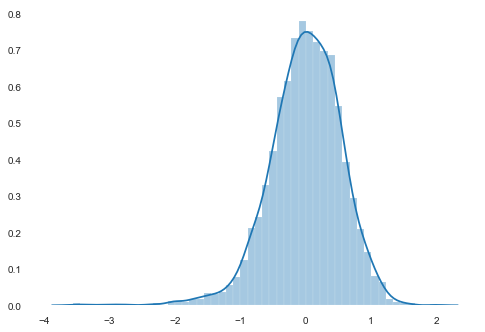

In [44]:
# assumption: Normality of the residuals/error (using distplot)
sns.distplot(model2.resid)
plt.show()

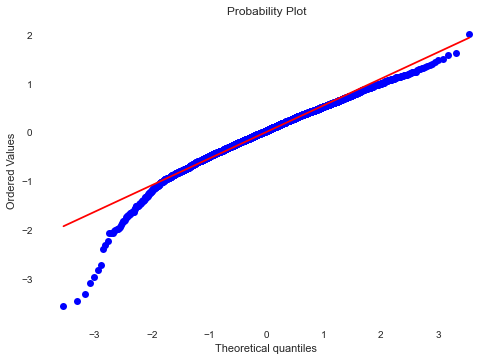

In [45]:
# assumption: Normality of the residuals/error (using Q-Q plot)
from scipy import stats
import pylab

stats.probplot(model2.resid, dist = 'norm', plot = pylab)
pylab.show()

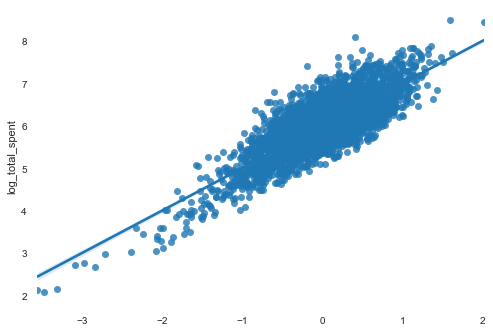

In [46]:
sns.regplot(x=model2.resid, y=train.log_total_spent)
#sns.jointplot(x=train.pred_limit, y=train.ln_cards_spent)
#sns.scatterplot(x=train.pred_limit, y=train.ln_cards_spent)
plt.show()

In [47]:
#Accuracy Metrics
#accuracy metrics
MAPE_train = np.mean(np.abs(train['log_total_spent'] - train['pred_limit'])/train['log_total_spent'])
print(MAPE_train)
MAPE_test = np.mean(np.abs(test['log_total_spent'] - test['pred_limit'])/test['log_total_spent'])
print(MAPE_test)

71.23073685533791
70.66021106424446


In [48]:
print('Parameters: ', model2.params)

print('R2: ', model2.rsquared)

Parameters:  Intercept         5.573017
addresscat        0.000411
agecat           -0.028794
agecat_4         -0.005889
agecat_5         -0.007601
agecat_6          0.025833
carcatvalue      -0.014648
card             -0.011178
card2             0.059278
card2_2          -0.475414
card2_3          -0.520430
card2_4          -0.612023
card2_5          -0.540349
card2benefit     -0.005093
card2benefit_3   -0.076846
card2type        -0.001842
card_2           -0.576178
card_3           -0.594760
card_4           -0.663361
card_5           -0.457104
cardbenefit       0.002606
cardtype         -0.005847
edcat            -0.028861
gender           -0.062623
inccat           -0.012745
lninc             0.399750
reason           -0.022142
reason_2          0.321188
reason_9          0.236162
region            0.006090
region_5          0.033655
dtype: float64
R2:  0.3432006474079471


In [49]:
## Building the model with train set and make predictions on test set
from sklearn.linear_model import LinearRegression
from sklearn import metrics

linreg = LinearRegression()
linreg.fit( train_X, train_y )

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [50]:
linreg.coef_

array([-3.54698775e+05,  3.54698756e+05,  7.09397514e+05,  1.06409624e+06,
        1.41879505e+06, -1.05671304e+09,  1.05671304e+09,  2.11342608e+09,
        3.17013912e+09,  4.22685216e+09, -5.74147421e+09,  1.14829484e+10,
        1.72244226e+10,  2.29658969e+10,  8.77750936e+08,  6.20215252e+09,
       -6.20215252e+09, -1.24043050e+10, -1.86064576e+10, -2.48086101e+10,
       -3.09937258e+09,  3.09937258e+09,  6.19874516e+09,  9.29811774e+09,
        5.84193022e+08, -5.84193022e+08, -1.16838604e+09, -1.75257907e+09,
       -8.77750936e+08, -1.75550187e+09, -2.63325281e+09, -3.51100374e+09,
        1.42841854e+09, -1.42841854e+09, -2.85683709e+09, -4.28525563e+09,
       -1.42305929e+09,  1.42305929e+09,  2.84611858e+09,  4.26917788e+09,
        3.72942388e-02, -6.63936138e-04,  3.69523913e-02, -2.10955143e-02,
        1.88589096e-04, -6.31226897e-02, -7.10749626e-03,  1.18917399e+09,
       -1.18917399e+09, -2.37834797e+09, -3.56752196e+09, -4.75669595e+09,
       -1.42883062e-02, -

In [51]:
linreg.score(train_X, train_y)

0.3480333050768517

In [52]:
y_pred_t = linreg.predict(train_X)
y_pred_t

array([5.74850941, 5.78242016, 5.65747166, ..., 6.79146099, 5.25802326,
       5.46751499])

In [53]:
y_pred_t = linreg.predict(train_X)
rmse_t = np.sqrt( metrics.mean_squared_error( train_y, y_pred_t) )
print(rmse_t)
print(metrics.r2_score( train_y, y_pred_t ))

0.5348079545101256
0.3480333050768517


In [54]:
y_pred = linreg.predict( test_X )
rmse = np.sqrt( metrics.mean_squared_error( test_y, y_pred ) )
print(rmse)
print(metrics.r2_score( test_y, y_pred ))

0.5692683533711069
0.32367832896119153


In [55]:
residuals = train_y - y_pred_t

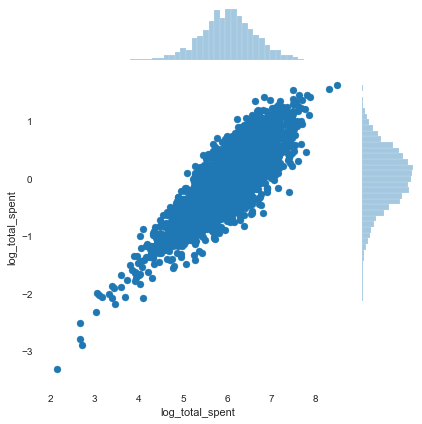

In [56]:
sns.jointplot(  train_y, residuals )

<AxesSubplot:xlabel='log_total_spent'>

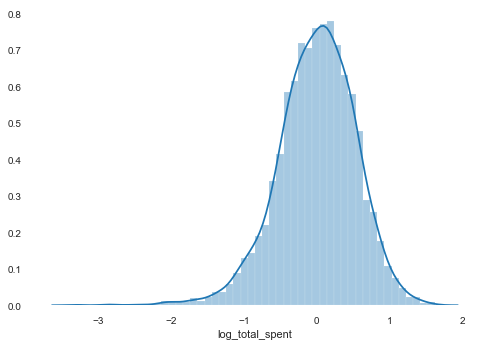

In [57]:
sns.distplot( residuals )

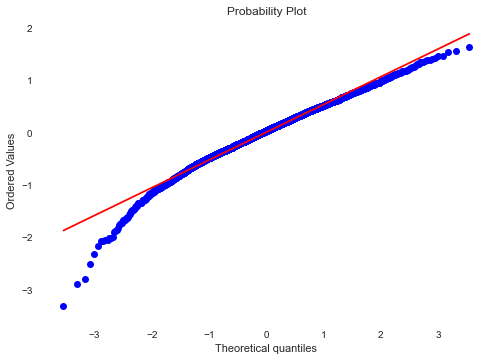

In [58]:
# To ensure residues are random i.e. normally distributed a Q-Q plot can be used
# Q-Q plot shows if the residuals are plotted along the line.
from scipy import stats
import pylab

stats.probplot( residuals, dist="norm", plot=pylab )
pylab.show()

In [59]:
#Feature Selection based on importance
from sklearn.feature_selection import f_regression
features = train_X
target = train_y
F_values, p_values  = f_regression(features, target )

In [60]:
import itertools
f_reg_results = [(i, v, z) for i, v, z in itertools.zip_longest(features.columns, F_values,  ['%.3f' % p for p in p_values])]

f_reg_results=pd.DataFrame(f_reg_results, columns=['Variable','F_Value', 'P_Value'])
f_reg_results

,Variable,F_Value,P_Value
0,addresscat,21.273360,0.000
1,addresscat_2,4.285745,0.039
2,addresscat_3,3.667907,0.056
3,addresscat_4,11.124623,0.001
4,addresscat_5,0.397521,0.528
...,...,...,...
62,region_3,0.015962,0.899
63,region_4,0.006987,0.933
64,region_5,2.933431,0.087
65,retire,108.918028,0.000


In [61]:
f_reg_results.sort_values(by=['P_Value'])

f_reg_results.P_Value = pd.to_numeric(f_reg_results.P_Value)

In [62]:
f_reg_results_new=f_reg_results[f_reg_results.P_Value<=0.1]

f_reg_results_new

,Variable,F_Value,P_Value
0,addresscat,21.273360,0.000
1,addresscat_2,4.285745,0.039
2,addresscat_3,3.667907,0.056
3,addresscat_4,11.124623,0.001
5,agecat,5.265193,0.022
6,agecat_3,4.178160,0.041
7,agecat_4,31.444360,0.000
8,agecat_5,29.529415,0.000
9,agecat_6,24.100731,0.000
10,carcatvalue,151.394208,0.000


In [63]:
my_formula="log_total_spent~addresscat_2+addresscat_3+addresscat_4+agecat_3+agecat_4+agecat_5+agecat_6+carcatvalue_1+carcatvalue_2+carcatvalue_3+card2_2+card2_3+card2_4+card2_5+card_2+card_3+card_4+card_5+card2benefit_3+card2benefit_4+cardbenefit_3+  inccat_2+inccat_3+inccat_4+inccat_5+reason_2+reason_4+retire+tenure+churn+edcat+empcat+gender+homeown+jobsat+lninc"              

In [64]:
lm = smf.ols(my_formula, data=train).fit()
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:        log_total_spent   R-squared:                       0.344
Model:                            OLS   Adj. R-squared:                  0.337
Method:                 Least Squares   F-statistic:                     50.39
Date:                Sun, 09 Aug 2020   Prob (F-statistic):          7.95e-285
Time:                        11:34:45   Log-Likelihood:                -2887.9
No. Observations:                3500   AIC:                             5850.
Df Residuals:                    3463   BIC:                             6078.
Df Model:                          36                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          5.5527      0.150     37.

In [65]:
train['pred_ln_spent'] = lm.predict(train)

C:\Users\anubh\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [66]:
train.head()

,gender,agecat,lninc,card,card2,log_total_spent,region,jobcat,jobsat,card2benefit,...,carcatvalue_1,carcatvalue_2,carcatvalue_3,addresscat_2,addresscat_3,addresscat_4,addresscat_5,pred_limit,Deciles,pred_ln_spent
4735,1,5,4.73,4,2,7.01,3,1,1,4,...,0,0,1,0,0,1,0,424.568377,5,6.061036
1796,0,6,4.49,3,2,5.86,5,6,1,1,...,0,0,1,0,0,0,1,475.637511,6,6.151282
479,1,4,4.99,3,4,5.77,5,2,2,2,...,0,0,1,0,0,1,0,493.402964,6,6.148602
2524,0,3,3.47,1,2,6.01,1,2,3,3,...,1,0,0,1,0,0,0,523.714899,7,6.243020
1565,0,4,3.53,3,1,5.00,3,2,4,2,...,1,0,0,0,1,0,0,506.628102,7,6.205750


In [67]:
test['pred_ln_spent']  = lm.predict(test)

C:\Users\anubh\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [68]:
test.head()

,gender,agecat,lninc,card,card2,log_total_spent,region,jobcat,jobsat,card2benefit,...,carcatvalue_1,carcatvalue_2,carcatvalue_3,addresscat_2,addresscat_3,addresscat_4,addresscat_5,pred_limit,Deciles,pred_ln_spent
2706,1,2,3.97,2,4,6.23,4,1,2,3,...,1,0,0,1,0,0,0,370.470425,4,5.961167
2436,1,6,3.43,3,2,5.85,1,3,4,1,...,1,0,0,0,0,1,0,257.769076,1,5.602755
1201,1,6,2.48,4,2,5.40,5,4,5,3,...,1,0,0,0,0,0,1,181.217698,0,5.161464
1486,0,5,3.09,1,2,6.98,3,2,2,1,...,1,0,0,1,0,0,0,483.313659,6,6.203580
4286,1,5,5.94,2,4,6.62,4,6,5,1,...,0,0,1,0,0,1,0,734.896757,9,6.593819


In [69]:
train['actual_spent'] = np.exp(train.log_total_spent)
test['actual_spent'] = np.exp(test.log_total_spent)

train['pred_spent'] = np.exp(train.pred_ln_spent)
test['pred_spent'] = np.exp(test.pred_ln_spent)

C:\Users\anubh\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\anubh\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\anubh\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in

In [70]:
train.head()

,gender,agecat,lninc,card,card2,log_total_spent,region,jobcat,jobsat,card2benefit,...,carcatvalue_3,addresscat_2,addresscat_3,addresscat_4,addresscat_5,pred_limit,Deciles,pred_ln_spent,actual_spent,pred_spent
4735,1,5,4.73,4,2,7.01,3,1,1,4,...,1,0,0,1,0,424.568377,5,6.061036,1107.654505,428.819343
1796,0,6,4.49,3,2,5.86,5,6,1,1,...,1,0,0,0,1,475.637511,6,6.151282,350.724144,469.318663
479,1,4,4.99,3,4,5.77,5,2,2,2,...,1,0,0,1,0,493.402964,6,6.148602,320.537733,468.062468
2524,0,3,3.47,1,2,6.01,1,2,3,3,...,0,1,0,0,0,523.714899,7,6.243020,407.483320,514.409706
1565,0,4,3.53,3,1,5.00,3,2,4,2,...,0,0,1,0,0,506.628102,7,6.205750,148.413159,495.590708


In [71]:
test.head()

,gender,agecat,lninc,card,card2,log_total_spent,region,jobcat,jobsat,card2benefit,...,carcatvalue_3,addresscat_2,addresscat_3,addresscat_4,addresscat_5,pred_limit,Deciles,pred_ln_spent,actual_spent,pred_spent
2706,1,2,3.97,2,4,6.23,4,1,2,3,...,0,1,0,0,0,370.470425,4,5.961167,507.755483,388.062777
2436,1,6,3.43,3,2,5.85,1,3,4,1,...,0,0,0,1,0,257.769076,1,5.602755,347.234380,271.172562
1201,1,6,2.48,4,2,5.40,5,4,5,3,...,0,0,0,0,1,181.217698,0,5.161464,221.406416,174.419535
1486,0,5,3.09,1,2,6.98,3,2,2,1,...,0,1,0,0,0,483.313659,6,6.203580,1074.918367,494.516342
4286,1,5,5.94,2,4,6.62,4,6,5,1,...,1,0,0,1,0,734.896757,9,6.593819,749.945097,730.565729


In [72]:
# calculate these metrics by hand!
from sklearn import metrics
import numpy as np
import scipy.stats as stats

In [73]:
#Train Data
MAPE_train = np.mean(np.abs(train.actual_spent - train.pred_spent)/train.actual_spent)
print(MAPE_train)


RMSE_train = metrics.mean_squared_error(train.actual_spent, train.pred_spent)
print(RMSE_train)

Corr_train = stats.stats.pearsonr(train.actual_spent , train.pred_spent)
print(Corr_train)

0.5283564681943479
89823.91115678466
(0.5812522349218785, 1.634305936e-315)


In [74]:
#Test Data
MAPE_test = np.mean(np.abs(test.actual_spent - test.pred_spent/test.actual_spent))
print(MAPE_test)

RMSE_test = metrics.mean_squared_error(test.actual_spent , test.pred_spent)
print(RMSE_test)

Corr_test = stats.stats.pearsonr(test.actual_spent , test.pred_spent)
print(Corr_test)

488.61900556296547
79437.09677677542
(0.5480226342510609, 2.513286698652746e-118)


In [75]:
train.columns

Index(['gender', 'agecat', 'lninc', 'card', 'card2', 'log_total_spent',
       'region', 'jobcat', 'jobsat', 'card2benefit', 'cardbenefit', 'cardtype',
       'card2type', 'reason', 'tenure', 'default', 'debtinc', 'edcat',
       'empcat', 'retire', 'inccat', 'homeown', 'addresscat', 'carcatvalue',
       'churn', 'agecat_3', 'agecat_4', 'agecat_5', 'agecat_6', 'reason_2',
       'reason_3', 'reason_4', 'reason_9', 'region_2', 'region_3', 'region_4',
       'region_5', 'card2benefit_2', 'card2benefit_3', 'card2benefit_4',
       'cardbenefit_2', 'cardbenefit_3', 'cardbenefit_4', 'card_2', 'card_3',
       'card_4', 'card_5', 'card2_2', 'card2_3', 'card2_4', 'card2_5',
       'cardtype_2', 'cardtype_3', 'cardtype_4', 'card2type_2', 'card2type_3',
       'card2type_4', 'inccat_2', 'inccat_3', 'inccat_4', 'inccat_5',
       'carcatvalue_1', 'carcatvalue_2', 'carcatvalue_3', 'addresscat_2',
       'addresscat_3', 'addresscat_4', 'addresscat_5', 'pred_limit', 'Deciles',
       'pred_ln_spen

In [76]:
train['Deciles']=pd.qcut(train['pred_spent'],10, labels=False)
test['Deciles']=pd.qcut(test['pred_spent'],10, labels=False)
test

C:\Users\anubh\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\anubh\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,gender,agecat,lninc,card,card2,log_total_spent,region,jobcat,jobsat,card2benefit,...,carcatvalue_3,addresscat_2,addresscat_3,addresscat_4,addresscat_5,pred_limit,Deciles,pred_ln_spent,actual_spent,pred_spent
2706,1,2,3.97,2,4,6.23,4,1,2,3,...,0,1,0,0,0,370.470425,4,5.961167,507.755483,388.062777
2436,1,6,3.43,3,2,5.85,1,3,4,1,...,0,0,0,1,0,257.769076,1,5.602755,347.234380,271.172562
1201,1,6,2.48,4,2,5.40,5,4,5,3,...,0,0,0,0,1,181.217698,0,5.161464,221.406416,174.419535
1486,0,5,3.09,1,2,6.98,3,2,2,1,...,0,1,0,0,0,483.313659,7,6.203580,1074.918367,494.516342
4286,1,5,5.94,2,4,6.62,4,6,5,1,...,1,0,0,1,0,734.896757,9,6.593819,749.945097,730.565729
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4470,0,5,3.58,1,4,5.95,2,2,2,1,...,0,0,1,0,0,570.957692,8,6.370269,383.753339,584.214976
1930,0,5,3.56,1,4,6.25,2,2,2,4,...,0,0,1,0,0,571.747323,8,6.369491,518.012825,583.760476
4460,0,2,3.43,4,1,4.65,3,2,1,3,...,0,0,0,0,0,425.353095,5,6.018614,104.584986,411.008638
2041,0,4,3.83,3,2,6.56,3,1,2,1,...,0,0,1,0,0,363.259986,3,5.839352,706.271695,343.556706


In [77]:
#Decile Analysis for train data
Predicted_avg = train[['Deciles','pred_spent']].groupby(train.Deciles).mean().sort_index(ascending=False)['pred_spent']
Actual_avg = train[['Deciles','log_total_spent']].groupby(train.Deciles).mean().sort_index(ascending=False)['log_total_spent']

Decile_analysis_train = pd.concat([Predicted_avg, Actual_avg], axis=1)

Decile_analysis_train

,pred_spent,log_total_spent
Deciles,,
9,875.584099,6.730057
8,630.508343,6.458943
7,531.389231,6.246029
6,463.437843,6.162000
5,410.819941,6.064371
4,367.584872,5.897971
3,330.445788,5.801257
2,299.608153,5.728371
1,270.548580,5.575514


In [78]:
Decile_analysis_test = pd.concat([Predicted_avg, Actual_avg], axis=1)

Decile_analysis_test

,pred_spent,log_total_spent
Deciles,,
9,875.584099,6.730057
8,630.508343,6.458943
7,531.389231,6.246029
6,463.437843,6.162000
5,410.819941,6.064371
4,367.584872,5.897971
3,330.445788,5.801257
2,299.608153,5.728371
1,270.548580,5.575514
